# ICA on $\zeta_{G}$ with Gaussian Peaks as NonG

## Notebook Setup

### Import modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
import matplotlib.gridspec as grd

import scipy.interpolate as interpolate
import scipy.signal as signal
import scipy.stats as stats

### modules contains Jaafar's modules
import modules.peaks as px
import modules.fouriertransform as ft
import modules.correlationfunctions as cf
import modules.gaussianfield as grf
import modules.filters as flt

"""
Independent Component Analysis

sklearn module contains contains a FastICA capability. We can chose the cost function (measure of non-Gaussianity): 
cube for kurtosis and logcosh for negentropy approximation.
"""
from sklearn.decomposition import FastICA

import modules.colorednoise as cn ## What was this for?
import modules.fastica_algo_Jonathan as ica


### Set parameters and initialize GRFs 

In [22]:
# Parameters
# Why do we need size_field = a power of 2?
logtwo_N = 20
N = 2**logtwo_N
size_field = N
seed = 50

# Other NG parameters
alpha = 1.0
nu = 2
c, w = 2, .2

# Generate the grfs using gaussianfield
g = grf.gaussian_random_field_1D(N, BoxSize=N, seed=seed)
f = grf.gaussian_random_field_1D(N, BoxSize=N, seed=10000)

## <u>Sklearn's FastICA implementation</u>
<b> For fully determined ICA separation.
<br>
Sklearn's implementation does not allow for underdetermined separation. </b>

### Setup

In [23]:
"""
num_peaks       :   num of different peaks to generate nonG signals
aPeak           :   amplitudes of peaks (irrelevant as ICA does not recover amplitudes)
xPeak           :   relative positions of peaks
wPeak           :   widths of peaks
rv              :   position (x) array of the field --> size_field number of evenly spaced samples in a given interval
source_noise    :   grf generated using gaussianfield [in Notebook Setup above]
source_nonG     :   returns n columns corresponding to n gaussian peaks that are shifted by xPeak/xc relative to 0 (and scaled by the size of the field)
source_comps    :   array of source component arrays
num_comps       :   num of different source signals/components, i.e. GRF & no. of peaks
num_samples     :   num of observations (has to be >= num_comps)
mix_matrix      :   mixing matrix generated randomly with entries over [0.5, 1)
mix_signal_pre  :   resulting mixed/observed signals (not prewhitened)
"""

num_peaks = 5
aPeak = [5, 5, 5, 5, 5] 
xPeak = [-7, -4, 0, 4, 7]
wPeak = [0.5, 0.1, 1.2, 0.7, 0.4]
rv = np.linspace(-10, 10, size_field)
source_noise = f # Gaussian random noise
source_nonG = np.array([ac*np.exp(-0.5*(rv-xc)**2/wc**2) for ac,xc,wc in zip(aPeak,xPeak,wPeak)]) # Peaks as separate source signals

source_comps = np.vstack([source_noise, source_nonG]) 
num_comps = source_comps.shape[0]
num_samples = num_comps

mix_matrix = (1+np.random.random((num_samples, num_comps)))/2.0 

In [24]:


print(mix_matrix.shape)
# print(mix_matrix)
mix_signal_pre = np.dot(mix_matrix, source_comps) # mixed signals
print(mix_signal_pre.shape)

(6, 6)
(6, 1048576)


### Sklearn--Fully determined FastICA separation

#### Apply Sklearn's $\texttt{FastICA}$

In [25]:
# initialize FastICA with given params
# Logcosh is negentropy.
ica = FastICA(n_components=num_comps, algorithm='deflation', max_iter=100, tol=1e-4, fun='logcosh')

# run FastICA on observed (mixed) signals
sl = ica.fit_transform(mix_signal_pre.T) # run FastICA on observed signals

In [ ]:
# ica = FastICA(n_components=num_comps, algorithm='deflation', max_iter=100, tol=1e-4, fun='cube')
# sc = ica.fit_transform(mix_signal_pre.T)

#### Plot the following:
#### (1) Observed signals (random mixtures of source components),
#### (2) Source components,
#### (3) ICA separated signals.

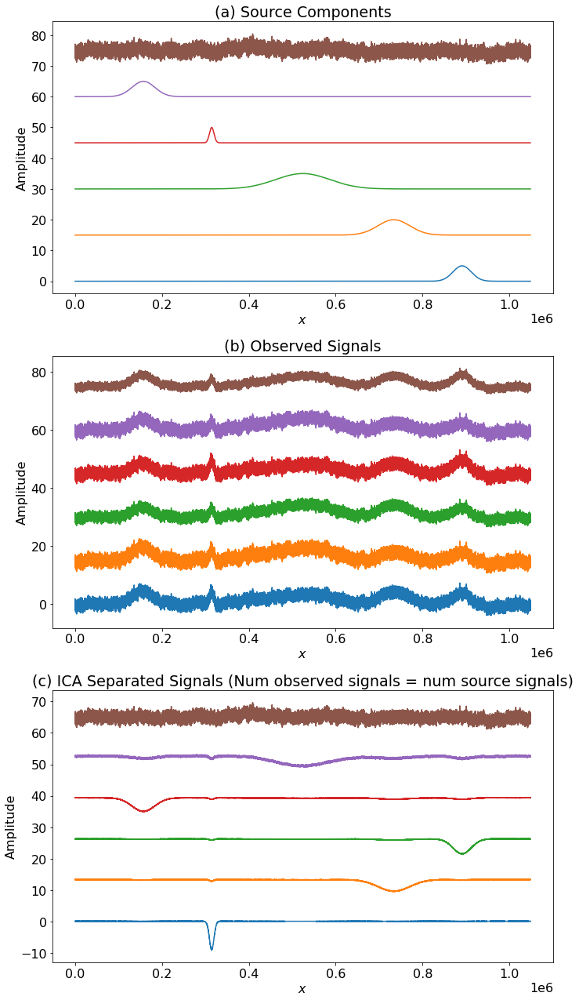

In [ ]:
fig, ax = plt.subplots(3,1,figsize=(10,18))
scomps = np.flip(source_comps, axis=0)

# Plotting source components
ax[0].set_title("(a) Source Components")
for i in range(scomps.T.shape[-1]):
    ax[0].plot(scomps.T[:,i]+15.*i)
ax[0].set(xlabel=r'$x$', ylabel="Amplitude")

# Plotting observed signals (mixtures of source signals)
ax[1].set_title("(b) Observed Signals")
for i in range(mix_signal_pre.T.shape[-1]):
    ax[1].plot(mix_signal_pre.T[:,i]+15.*i)
ax[1].set(xlabel=r'$x$', ylabel="Amplitude")

# Plotting signals separated by ICA
ax[2].set_title("(c) ICA Separated Signals (Num observed signals = num source signals)")
for i in range(sl.shape[-1]):
    ax[2].plot(866.7*sl[:,i]+13.*i) # Amplitudes are scaled arbitrarily because ICA doesn't recover amp
ax[2].set(xlabel=r'$x$', ylabel="Amplitude")

fig.tight_layout()

### [WIP] Rank-order the extracted signals (by a nonG measure)
e.g. using kurtosis

In [ ]:
# # Rank-order by a nonGaussianity measure (kurtosis for simplicity)
# nt = 100; a = np.empty((nt,s.shape[0],s.shape[1])) 
# for i in range(nt):
#     a[i] = ica.extract_peaks_nn(num_samples=num_samples, num_components=num_comps, noise=noise, aPeak=aPeak, xPeak=xPeak, wPeak=wPeak, ns=size_field)[-1]
# kur = ica.kurtosis(a)

# print(kur.shape)
# fig, a = plt.subplots()
# fig.set_size_inches(15, 15)
# for i in range(kur.shape[-1]):
#     a.plot(kur[:,i]+25.*i)

## <u>Jonathan's FastICA implementation</u>

### Setup

#### Create sample $\zeta$ with Gaussian Random component and Gaussian peaks as nonG

In [6]:
"""
num_peaks   :   no. of different peaks to generate nonG signals
aPeak       :   amplitudes of peaks (irrelevant as ICA does not recover amplitudes)
xPeak       :   relative positions of peaks
wPeak       :   widths of peaks
rv          :   position (x) array of the field --> size_field number of evenly spaced samples in a given interval
noise       :   function to import random samples from a normal distr
peaks       :   returns n columns corresponding to n gaussian peaks that are shifted by xPeak/xc relative to 0 (and scaled by the size of the field)
sum_peaks   :   single field with all peaks combined
sig         :   columns corresponding to source components
                i.e. GRF and given number of peaks (so GRF + n nonG components, where n is num peaks)
num_comps   :   no. of different source signals/components, i.e. GRF & no. of peaks
"""

num_peaks = 3
aPeak = [4, 4, 4]
xPeak = [-7, 0, 7]
wPeak = [0.5, 0.1, 1.2]
rv = np.linspace(-10, 10, size_field) # discrete position array for -10 <= x <= 10
noise = np.random.normal ## This is not completely necessary, since JB's code generates the noise itself in the same way
peaks = np.vstack( np.array([ac*np.exp(-0.5*(rv-xc)**2/wc**2) for ac,xc,wc in zip(aPeak,xPeak,wPeak)]) ).T

# sum_peaks is single field with all peaks combined
sum_peaks = np.zeros(peaks.shape[0])
for i in range(peaks.shape[-1]):
    sum_peaks = sum_peaks + peaks[:,i]

# sig has columns corresponding to source components, 
# i.e. GRF and given number of peaks (so GRF + n nonG components, where n is num peaks)
sig = np.vstack( [np.array([ac*np.exp(-0.5*(rv-xc)**2/wc**2) for ac,xc,wc in zip(aPeak,xPeak,wPeak)]), g.T] ).T
num_comps = sig.shape[1]

<b> <u> QUESTION: <i>Should I treat the GRF and peaks as separate signals (so total source signals would be GRF + each peak), or should I add GR noise to each peak signal (resulting in source signals being each noisy peak and no separate GRF)? Why might this be useful/useless?</i> </b> </u>

#### Plot GRF

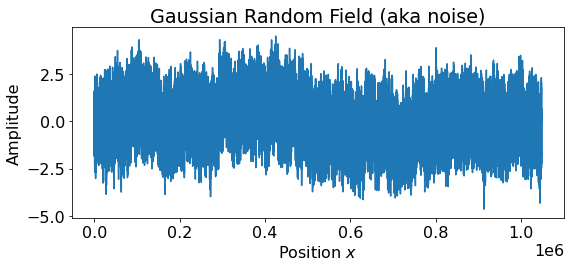

In [7]:
fig, ax = plt.subplots(1,1,figsize=(8,4))

ax.set_title("Gaussian Random Field (aka noise)")
ax.plot(g) # GRF
ax.set(xlabel=r'Position $x$', ylabel="Amplitude")
fig.tight_layout()

#### Plot nonG signal (Gaussian Peaks)

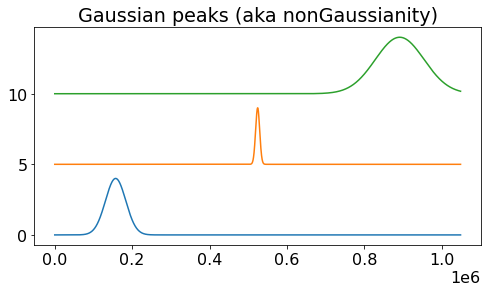

In [8]:
fig, a = plt.subplots(1,1,figsize=(8,4))

a.set_title("Gaussian peaks (aka nonGaussianity)")
for i in range(peaks.T.shape[0]):
    a.plot(peaks.T[i,:]+5.*i)

### JB Code--Fully determined FastICA separation

Note that an observed signal is some mixture of all of the source components.

ICA requires that num observed signals >= num source components.

#### Apply JB's $\texttt{FastICA}$

In [6]:
"""
Running ica separation on the above setup of signals
for the fully determined case: num_samples = num_comps.
"""
num_samples = num_comps

"""
This (ica.extract_peaks_nn_g) executes the ICA separation using Jonathan's code.

Input:
    num_samples     : num observed randomly mixed signals
    num_components  : num source/original comps
    g               : the underlying GRF (as one of the source comps)
    aPeak           : peak amplitudes
    xPeak           : peak positions
    wPeak           : peak widths
    ns              : size of field

Output:
    s               : array of arrays of separate source components
    smix            : array of arrays of observed (randomly mixed) signals
    sr              : ica separated signals (as separate columns)
"""
s, smix, sr = ica.extract_peaks_nn_g(num_samples=num_samples, num_components=num_comps, g=g, aPeak=aPeak, xPeak=xPeak, wPeak=wPeak, ns=size_field)

#### Plot the following:
#### (1) Source components,
#### (2) Observed signals (random mixtures of source components),
#### (3) ICA separated signals.

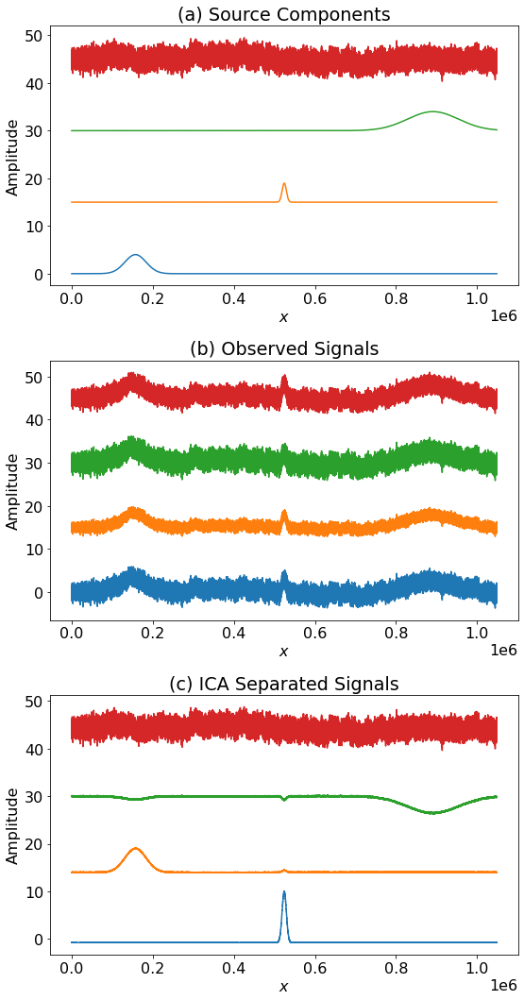

In [7]:
fig, ax = plt.subplots(3,1,figsize=(8,15))

# Plotting source components
ax[0].set_title("(a) Source Components")
for i in range(s.shape[-1]):
    ax[0].plot(s[:,i]+15.*i)
ax[0].set(xlabel=r'$x$', ylabel="Amplitude")

# Plotting observed signals (mixtures of source signals)
ax[1].set_title("(b) Observed Signals")
for i in range(smix.T.shape[-1]):
    ax[1].plot(smix.T[:,i]+15.*i)
ax[1].set(xlabel=r'$x$', ylabel="Amplitude")

# Plotting signals separated by ICA
ax[2].set_title("(c) ICA Separated Signals")
for i in range(sr.shape[-1]):
    ax[2].plot(sr[:,i]+15.*i)
ax[2].set(xlabel=r'$x$', ylabel="Amplitude")

fig.tight_layout()

### JB Code--Underdetermined ICA separation
Plots from fully determined to fully underdetermined ICA separation of the same source components

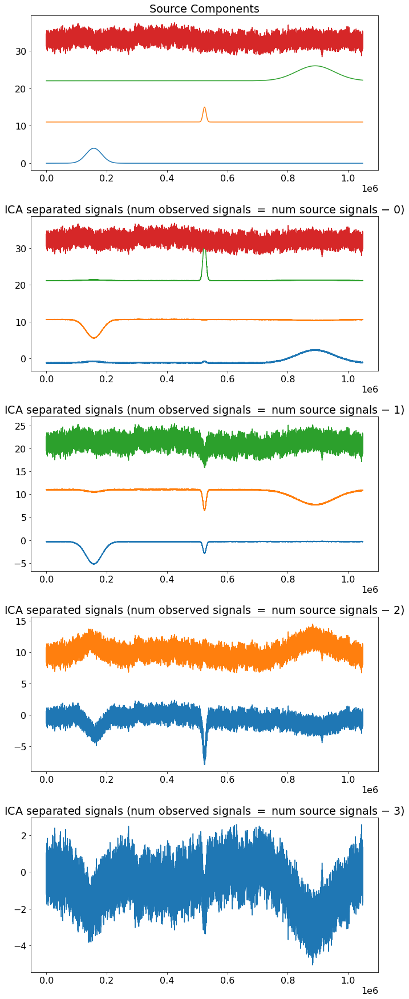

In [8]:
"""
Here I'm plotting the original components (source components) and ICA separation.

Starting from full separation, i.e. num source components = num observed (randomly mixed) signals,
every subsequent plot assumes one fewer num observed signals than previous plot's.
This is an attempt to explore underdetermined problem (having fewer observations than 
source components).

E.g. if num source components = num observed signals = 4 [GRF + 3 signals (corresponding to each of 3 peaks)],
then first separated plot assumes num obs sigs = 3, 
second plot assumes num obs sigs = 2,
and last plot assumes num obs sigs = 1.
"""
fig, axs = plt.subplots(num_comps+1, 1, figsize=(10,25))
# fig, axs = plt.subplots(num_comps+1, 1, sharex=True, figsize=(10,25))
fig.add_subplot(111, frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
# plt.ylabel("Amplitude")
# plt.setp([a.get_xticklabels() for a in fig.axes[:-1]], visible=False)

"""
First For loop plots the separate source components (e.g. GRF + 3 gaussian peaks).

Second For loop plots the ICA separation with increasing underdeterminedness.
"""
for i in range(sig.shape[-1]):
    axs[0].set_title(r'Source Components')
    axs[0].plot(sig[:,i]+11.*i)

for j in range(num_comps):
    num_samples = num_comps - j # num_samples is the num observed signals for short

    # ica separation using Jonathan's code (see above for inputs/outputs)
    s, smix, sr = ica.extract_peaks_nn_g(num_samples=num_samples, num_components=num_comps, g=g, aPeak=aPeak, xPeak=xPeak, wPeak=wPeak, ns=size_field)

    # Plot ica separated signals
    axs[1+j].set_title(r'ICA separated signals (num observed signals $=$ num source signals $-$ {0})'.format(j))
    for i in range(sr.shape[-1]):
        axs[1+j].plot(sr[:,i]+11.*i)

# axs[1+j].xaxis.set_tick_params(labelbottom=True)
# plt.xlabel(r'$x$')
fig.tight_layout()
# fig.subplots_adjust(hspace=0)

# plt.text(0.4, 0.9, r'Source Components', horizontalalignment='right', color='black', 
#              fontsize=20, bbox={'facecolor': 'red', 'alpha': 0.5, 'pad': 5})

### [WIP] Rank-order the extracted signals (by a nonG measure)
e.g. using kurtosis

In [9]:
# # Rank-order by a nonGaussianity measure (kurtosis for simplicity)
# nt = 100; a = np.empty((nt,s.shape[0],s.shape[1])) 
# for i in range(nt):
#     a[i] = ica.extract_peaks_nn(num_samples=num_samples, num_components=num_comps, noise=noise, aPeak=aPeak, xPeak=xPeak, wPeak=wPeak, ns=size_field)[-1]
# kur = ica.kurtosis(a)

# print(kur.shape)
# fig, a = plt.subplots()
# fig.set_size_inches(15, 15)
# for i in range(kur.shape[-1]):
#     a.plot(kur[:,i]+25.*i)

# NOTES:

<b><i>
1.  [What's the difference between the GRFs generated here vs those generated by JB's code?](#set-parameters-and-initialize-grfs)
2.  [Change JB's code to incorporate GRF generation using 'gaussianfield'](#ujonathans-fastica-implementationu)
3.  [Prewhiten the composite $\zeta$ field provided to Sklearn FastICA](#usklearns-fastica-implementationu)

</i></b>